In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List
from tqdm import tqdm

In [3]:
def remove_spines(ax, left=True, right=False, top=False, bottom=True):
    """Remove spines from a matplotlib axis."""
    ax.spines['left'].set_visible(left)
    ax.spines['right'].set_visible(right)
    ax.spines['top'].set_visible(top)
    ax.spines['bottom'].set_visible(bottom)

# Data Exploration

In [4]:
data_dir = './'
df_energy = pd.read_csv(data_dir + 'energy_dataset.csv')
df_weather = pd.read_csv(data_dir + 'weather_features.csv')

In [5]:
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [6]:
df_energy['time'] = pd.to_datetime(df_energy['time'], utc='True')

In [7]:
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [8]:
df_weather['dt_iso'] = pd.to_datetime(df_weather['dt_iso'], utc=True)

In [9]:
energy_columns = df_energy.columns.tolist()
energy_columns.remove('time')
fig, axes = plt.subplots(figsize=(12, 96), nrows=len(energy_columns), ncols=2)
fig.set_dpi(300)
for i, column in enumerate(energy_columns):
    ax_kde = axes[i, 0]
    ax_time = axes[i, 1]
    sns.histplot(df_energy[column], bins=50, kde=True, color='green', ax=ax_kde)
    ax_kde.set_title(column)
    ax_kde.set_xlabel('Value')
    ax_kde.set_ylabel('Frequency')
    remove_spines(ax_kde)
    sns.lineplot(x=df_energy['time'], y=df_energy[column], color='salmon', ax=ax_time)
    ax_time.set_title(column)
    ax_time.set_xlabel('Time')
    ax_time.set_ylabel('Value')
    ax_time.tick_params(axis='x', rotation=45)
    remove_spines(ax_time)
fig.tight_layout()
plt.show()

# Data Preprocessing

## Energy Table

## Removing missing values

In [10]:
num_nulls = df_energy.isnull().sum()
ratio_nulls = num_nulls / df_energy.shape[0]
print(f"Number of nulls in each column:")
df_nulls = pd.DataFrame({
    'num_nulls': num_nulls,
    'ratio_nulls': ratio_nulls
}).sort_values('ratio_nulls', ascending=False)
df_nulls[df_nulls['num_nulls'] > 0]

Number of nulls in each column:


,num_nulls,ratio_nulls
generation hydro pumped storage aggregated,35064,1.000000
forecast wind offshore eday ahead,35064,1.000000
total load actual,36,0.001027
generation waste,19,0.000542
generation biomass,19,0.000542
generation hydro pumped storage consumption,19,0.000542
generation marine,19,0.000542
generation hydro run-of-river and poundage,19,0.000542
generation fossil oil,19,0.000542
generation fossil peat,18,0.000513


In [11]:
columns_to_drop = ['generation hydro pumped storage aggregated', 'forecast wind offshore eday ahead']
df_energy.drop(columns=columns_to_drop, inplace=True)
mask = df_energy['generation fossil oil'].isnull()
df_energy = df_energy[~mask]
num_nulls = df_energy.isnull().sum()
ratio_nulls = num_nulls / df_energy.shape[0]
df_nulls = pd.DataFrame({
    'num_nulls': num_nulls,
    'ratio_nulls': ratio_nulls
}).sort_values('ratio_nulls', ascending=False)
df_nulls[df_nulls['num_nulls'] > 0]

,num_nulls,ratio_nulls
total load actual,23,0.000656
generation marine,1,0.000029
generation waste,1,0.000029
generation hydro pumped storage consumption,1,0.000029
generation hydro run-of-river and poundage,1,0.000029
generation biomass,1,0.000029


## Removing All zero values

In [12]:
num_zeros = (df_energy == 0).sum()
ratio_zeros = num_zeros / df_energy.shape[0]
print(f"Number of nulls in each column:")
df_nulls = pd.DataFrame({
    'num_zeros': num_zeros,
    'ratio_zeros': ratio_zeros
}).sort_values('num_zeros', ascending=False)
df_nulls[df_nulls['num_zeros'] > 0]

Number of nulls in each column:


,num_zeros,ratio_zeros
generation fossil coal-derived gas,35045,1.000000
generation wind offshore,35045,1.000000
generation fossil oil shale,35045,1.000000
generation fossil peat,35045,1.000000
generation geothermal,35045,1.000000
generation marine,35044,0.999971
generation hydro pumped storage consumption,12607,0.359737
generation fossil brown coal/lignite,10517,0.300100
forecast solar day ahead,539,0.015380
generation other,4,0.000114


In [13]:
columns_to_drop = [
    "generation fossil coal-derived gas",
    "generation wind offshore",
    "generation fossil oil shale",
    "generation fossil peat",
    "generation geothermal",
    "generation marine",
]
df_energy.drop(columns=columns_to_drop, inplace=True)
num_zeros = (df_energy == 0).sum()
ratio_zeros = num_zeros / df_energy.shape[0]
df_zeros = pd.DataFrame({
    'num_zeros': num_zeros,
    'ratio_zeros': ratio_zeros
}).sort_values('num_zeros', ascending=False)
df_zeros[df_zeros['num_zeros'] > 0]

,num_zeros,ratio_zeros
generation hydro pumped storage consumption,12607,0.359737
generation fossil brown coal/lignite,10517,0.300100
forecast solar day ahead,539,0.015380
generation other,4,0.000114
generation biomass,4,0.000114
generation wind onshore,3,0.000086
generation waste,3,0.000086
generation solar,3,0.000086
generation other renewable,3,0.000086
generation hydro water reservoir,3,0.000086


## Weather data

## Handling weather variables

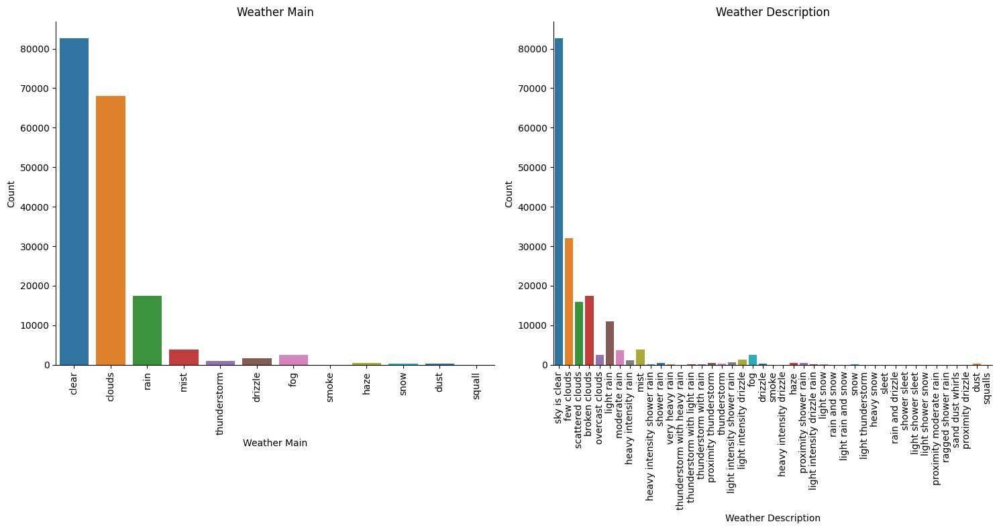

In [14]:
fig, ax = plt.subplots(figsize=(15, 8), ncols=2)
sns.countplot(
    x="weather_main", hue="weather_main", data=df_weather, palette="tab10", ax=ax[0]
)
ax[0].set_title("Weather Main")
ax[0].set_xlabel("Weather Main")
ax[0].tick_params(axis="x", rotation=90)
ax[0].set_ylabel("Count")
remove_spines(ax[0])
sns.countplot(
    x="weather_description",
    hue="weather_description",
    data=df_weather,
    palette="tab10",
    ax=ax[1],
)
ax[1].set_title("Weather Description")
ax[1].set_xlabel("Weather Description")
ax[1].tick_params(axis="x", rotation=90)
ax[1].set_ylabel("Count")
remove_spines(ax[1])
fig.tight_layout()
plt.show()

In [15]:
import plotly.graph_objects as go


df_counts = df_weather.groupby(['weather_main', 'weather_description']).size().reset_index(name='count')

# Add prefixes to distinguish levels
df_counts['weather_main'] = 'Main: ' + df_counts['weather_main']
df_counts['weather_description'] = 'Desc: ' + df_counts['weather_description']

# Unique labels
all_labels = pd.concat([df_counts['weather_main'], df_counts['weather_description']]).unique()
label_to_index = {label: i for i, label in enumerate(all_labels)}

# Source, target, value
sources = df_counts['weather_main'].map(label_to_index)
targets = df_counts['weather_description'].map(label_to_index)
values = df_counts['count']

# Sankey plot
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_labels
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values
    )
)])

fig.update_layout(title_text="Weather Main → Weather Description (No Loops)", font_size=10, width=1000, height=900)
fig.show()


In [16]:
id_to_desc = df_weather.groupby('weather_id')['weather_description'].nunique()
non_unique_ids = id_to_desc[id_to_desc > 1]
if non_unique_ids.empty:
    print("Each weather_id maps to a unique weather_description.")
else:
    print("The following weather_id(s) map to multiple descriptions:")
    print(non_unique_ids)

desc_to_id = df_weather.groupby('weather_description')['weather_id'].nunique()
non_unique_descs = desc_to_id[desc_to_id > 1]
if non_unique_descs.empty:
    print("Each weather_description maps to a unique weather_id.")
else:
    print("The following weather_description(s) map to multiple IDs:")
    print(non_unique_descs)

The following weather_id(s) map to multiple descriptions:
weather_id
211    2
301    2
501    2
521    2
612    2
Name: weather_description, dtype: int64
Each weather_description maps to a unique weather_id.


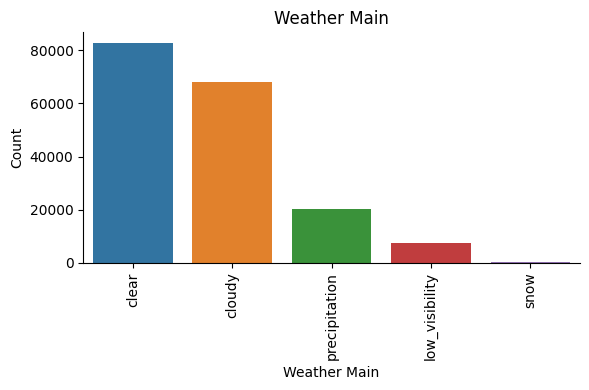

In [17]:
# Create a mapping dictionary to merge categories
merge_dict = {
    'clear': 'clear',
    'clouds': 'cloudy',
    'rain': 'precipitation',
    'drizzle': 'precipitation',
    'thunderstorm': 'precipitation',
    'squall': 'precipitation',
    'mist': 'low_visibility',
    'fog': 'low_visibility',
    'haze': 'low_visibility',
    'smoke': 'low_visibility',
    'dust': 'low_visibility',
    'snow': 'snow',
}

# Apply the merge using replace
df_weather['weather_main'] = df_weather['weather_main'].replace(merge_dict)

# Verify changes
fig, ax = plt.subplots(figsize=(6, 4))
sns.countplot(x='weather_main', hue = 'weather_main', data=df_weather, ax=ax, palette='tab10')
ax.set_title('Weather Main')
ax.set_xlabel('Weather Main')
ax.tick_params(axis='x', rotation=90)
ax.set_ylabel('Count')
remove_spines(ax)
fig.tight_layout()
plt.show()


In [18]:
# Drop weather_id and weather_icon and weather_decscription, map weather_main to one-hot
columns_to_drop = ['weather_id', 'weather_icon', 'weather_description']
df_weather.drop(columns=columns_to_drop, inplace=True)
df_weather = pd.get_dummies(df_weather, columns=['weather_main'], prefix='', prefix_sep='', dtype='float')
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,clear,cloudy,low_visibility,precipitation,snow
0,2014-12-31 23:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0
1,2015-01-01 00:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0
2,2015-01-01 01:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0
3,2015-01-01 02:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0
4,2015-01-01 03:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0


## Merging cities

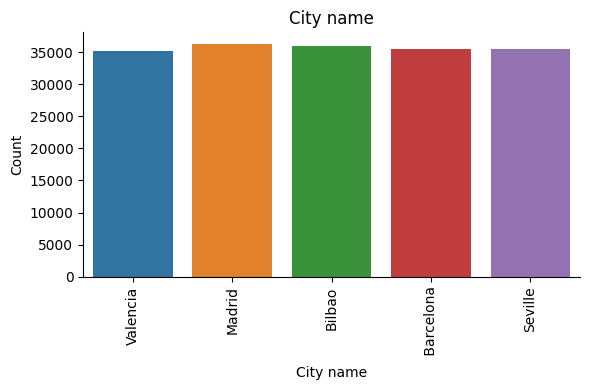

In [19]:
fig, ax = plt.subplots(figsize=(6, 4))
sns.countplot(x='city_name', hue='city_name', data=df_weather, ax=ax, palette='tab10')
ax.set_title('City name')
ax.set_xlabel('City name')
ax.tick_params(axis='x', rotation=90)
ax.set_ylabel('Count')
remove_spines(ax)
fig.tight_layout()
plt.show()


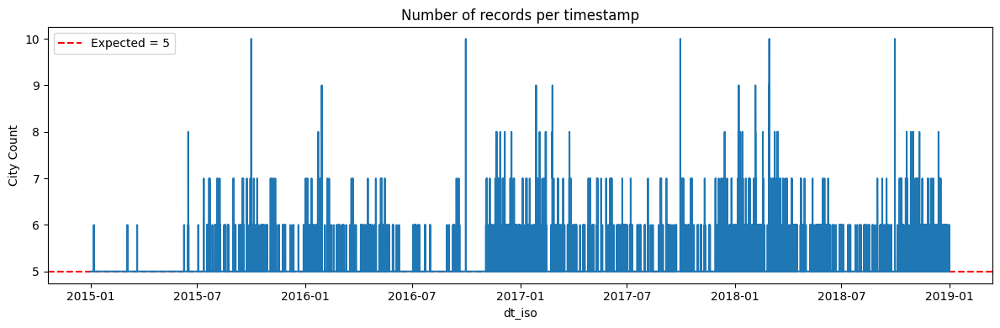

In [20]:
#drop duplicates
counts = df_weather.groupby('dt_iso')['city_name'].count().reset_index(name='city_count')

plt.figure(figsize=(12, 4))
plt.axhline(5, color='red', linestyle='--', label='Expected = 5')
sns.lineplot(data=counts, x='dt_iso', y='city_count')
plt.title('Number of records per timestamp')
plt.ylabel('City Count')
plt.legend()
plt.tight_layout()
plt.show()


## Averaging across cities

In [21]:
columns_to_drop = ['city_name']
df_weather.drop(columns=columns_to_drop, inplace=True)
df_weather = df_weather.groupby('dt_iso', as_index=False).mean()
df_weather.head()

,dt_iso,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,clear,cloudy,low_visibility,precipitation,snow
0,2014-12-31 23:00:00+00:00,272.491463,272.491463,272.491463,1016.4,82.4,2.0,135.2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2015-01-01 00:00:00+00:00,272.512700,272.512700,272.512700,1016.2,82.4,2.0,135.8,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2015-01-01 01:00:00+00:00,272.099137,272.099137,272.099137,1016.8,82.0,2.4,119.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,2015-01-01 02:00:00+00:00,272.089469,272.089469,272.089469,1016.6,82.0,2.4,119.2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,2015-01-01 03:00:00+00:00,272.145900,272.145900,272.145900,1016.6,82.0,2.4,118.4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# Analysis of cleaned datasets

In [22]:
energy_columns = df_energy.columns.tolist()
energy_columns.remove('time')
fig, axes = plt.subplots(figsize=(12, 96), nrows=len(energy_columns), ncols=2)
fig.set_dpi(300)
for i, column in enumerate(energy_columns):
    ax_kde = axes[i, 0]
    ax_time = axes[i, 1]
    sns.histplot(df_energy[column], bins=50, kde=True, color='green', ax=ax_kde)
    ax_kde.set_title(column)
    ax_kde.set_xlabel('Value')
    ax_kde.set_ylabel('Frequency')
    remove_spines(ax_kde)
    sns.lineplot(x=df_energy['time'], y=df_energy[column], color='salmon', ax=ax_time)
    ax_time.set_title(column)
    ax_time.set_xlabel('Time')
    ax_time.set_ylabel('Value')
    ax_time.tick_params(axis='x', rotation=45)
    remove_spines(ax_time)
fig.tight_layout()
plt.show()

In [23]:
energy_columns = df_weather.columns.tolist()
energy_columns.remove('dt_iso')
fig, axes = plt.subplots(figsize=(12, 64), nrows=len(energy_columns), ncols=2)
fig.set_dpi(300)
for i, column in enumerate(energy_columns):
    ax_kde = axes[i, 0]
    ax_time = axes[i, 1]
    sns.histplot(df_weather[column], bins=50, kde=True, color='blue', ax=ax_kde)
    ax_kde.set_title(column)
    ax_kde.set_xlabel('Value')
    ax_kde.set_ylabel('Frequency')
    remove_spines(ax_kde)
    sns.lineplot(x=df_weather['dt_iso'], y=df_weather[column], color='salmon', ax=ax_time)
    ax_time.set_title(column)
    ax_time.set_xlabel('Time')
    ax_time.set_ylabel('Value')
    ax_time.tick_params(axis='x', rotation=45)
    remove_spines(ax_time)
fig.tight_layout()
plt.show()

## Merge tables

In [24]:
df_merged = pd.merge(df_energy, df_weather, left_on='time', right_on='dt_iso', how='inner')
df_merged.drop(columns=['dt_iso'], inplace=True)
df_merged.sort_values('time', inplace=True, ascending=True)
df_merged.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,...,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,clear,cloudy,low_visibility,precipitation,snow
0,2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,135.2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,135.8,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,119.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,119.2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,118.4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


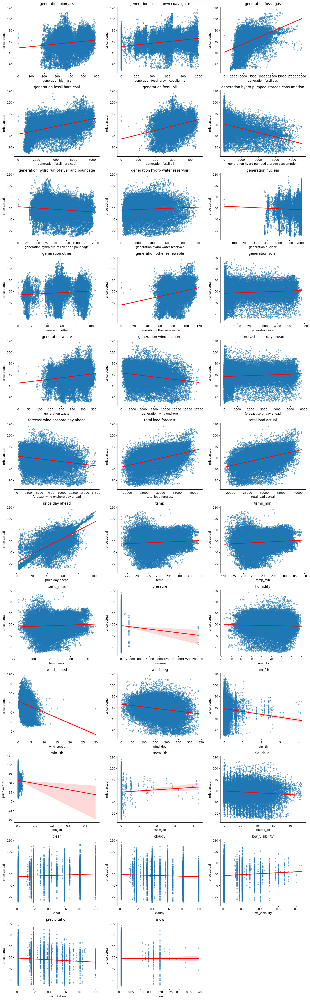

In [25]:
features = df_merged.columns.drop(['time', 'price actual'])
ordinal_features = ['generation hydro', 'generation wind onshore', 'generation solar']
n_cols = 3
n_rows = int(np.ceil(len(features) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

for i, feature in enumerate(features):
    row, col = divmod(i, n_cols)
    sns.regplot(x=feature, y='price actual', data=df_merged, ax=axes[row][col],
                scatter_kws={'s': 10, 'alpha': 0.5},
                line_kws={'color': 'red'})
    axes[row][col].set_title(feature)
    remove_spines(axes[row][col])

# Hide unused subplots
for j in range(i + 1, n_rows * n_cols):
    row, col = divmod(j, n_cols)
    axes[row][col].set_visible(False)

fig.tight_layout()
plt.show()


# Model Developing

In [34]:
# retrieve all columns except time and price
df_merged = df_merged.ffill()
df_features = df_merged.drop(columns=['time', 'price actual'])
df_time = df_merged['time']
df_target = df_merged['price actual']

X_all = df_features.to_numpy()
y_all = df_target.to_numpy()
time_all = df_time.to_numpy()

train_size = 0.8
# Calculate split index
split_index = int(len(X_all) * train_size)

df_features_train = df_features[:split_index]
df_features_test = df_features[split_index:]
df_target_train = df_target[:split_index]
df_target_test = df_target[split_index:]

X_train = df_features_train.to_numpy()
X_test = df_features_test.to_numpy()
y_train = df_target_train.to_numpy()
y_test = df_target_test.to_numpy()

time_train = df_time[:split_index].to_numpy()
time_test = df_time[split_index:].to_numpy()

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


## OLS

In [46]:
import statsmodels.api as sm

X_train_const = sm.add_constant(df_features_train)
X_test_const = sm.add_constant(df_features_test)

smodel = sm.OLS(df_target_train, X_train_const).fit()

print(smodel.summary())

preds_train = smodel.predict(X_train_const)
preds_test = smodel.predict(X_test_const)

OLS_MSE = np.mean((preds_test - y_test) ** 2)

print("OLS")
print(f"Train R^2: {smodel.rsquared:.4f}")
print(f"Test R^2: {smodel.rsquared_adj:.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {OLS_MSE:.4f}")


                            OLS Regression Results                            
Dep. Variable:           price actual   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     1259.
Date:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00
Time:                        18:35:46   Log-Likelihood:            -1.0123e+05
No. Observations:               28036   AIC:                         2.025e+05
Df Residuals:                   28001   BIC:                         2.028e+05
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

## Linear Regression

In [50]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
preds_train = lr.predict(X_train)
preds_test = lr.predict(X_test)

LR_MSE = np.mean((preds_test - y_test) ** 2)

print("Linear Regression")
print(f"Train R^2: {lr.score(X_train, y_train):.4f}")
print(f"Test R^2: {lr.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {LR_MSE:.4f}")

Linear Regression
Train R^2: 0.6046
Test R^2: 0.5265
Train MSE: 80.0978
Test MSE: 63.5404


## RidgeRegression

In [54]:
from sklearn.linear_model import RidgeCV
import numpy as np

# You can specify a list of alpha values to cross-validate over
alphas = np.logspace(-8, 8, 1000)

ridge = RidgeCV(alphas=alphas, store_cv_results=True)
ridge.fit(X_train, y_train)

preds_train = ridge.predict(X_train)
preds_test = ridge.predict(X_test)

Ridge_MSE = np.mean((preds_test - y_test) ** 2)

print("Ridge Regression with Cross-Validation")
print(f"Selected Alpha: {ridge.alpha_:.4f}")
print(f"Train R^2: {ridge.score(X_train, y_train):.4f}")
print(f"Test R^2: {ridge.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {Ridge_MSE:.4f}")

Ridge Regression with Cross-Validation
Selected Alpha: 0.3763
Train R^2: 0.6046
Test R^2: 0.5263
Train MSE: 80.1031
Test MSE: 63.5651


## Lasso Regression

In [55]:
from sklearn.linear_model import LassoCV
import numpy as np

# Define the range of alphas to try
alphas = np.logspace(-8, 8, 1000)

lasso = LassoCV(alphas=alphas, cv=5, max_iter=10000)
lasso.fit(X_train, y_train)

preds_train = lasso.predict(X_train)
preds_test = lasso.predict(X_test)

Lasso_MSE = np.mean((preds_test - y_test) ** 2)

print("Lasso Regression with Cross-Validation")
print(f"Best Alpha from CV: {lasso.alpha_:.4f}")
print(f"Train R^2: {lasso.score(X_train, y_train):.4f}")
print(f"Test R^2: {lasso.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {Lasso_MSE:.4f}")


Lasso Regression with Cross-Validation
Best Alpha from CV: 13.9684
Train R^2: 0.5416
Test R^2: 0.3477
Train MSE: 92.8653
Test MSE: 87.5309


## Support Vector Regression

In [ ]:
"""from sklearn.svm import LinearSVR
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define a parameter grid for LinearSVR
param_grid = {
    "C": [0.01, 0.1, 1.0, 10.0],
    "epsilon": [0.0, 0.1, 0.2]
}

lsvr = LinearSVR(max_iter=10000, random_state=42)
lsvr_cv = GridSearchCV(lsvr, param_grid, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)
lsvr_cv.fit(X_train, y_train)

best_lsvr = lsvr_cv.best_estimator_
preds_train = best_lsvr.predict(X_train)
preds_test = best_lsvr.predict(X_test)

LSVR_MSE = np.mean((preds_test - y_test) ** 2)

print("Linear SVR with Grid Search")
print(f"Best Params: {lsvr_cv.best_params_}")
print(f"Train R^2: {best_lsvr.score(X_train, y_train):.4f}")
print(f"Test R^2: {best_lsvr.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {LSVR_MSE:.4f}")
"""

## Decision Tree

In [59]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the hyperparameter grid
param_grid = {
    "max_depth": [3, 5, 10, 20, 50, None],
    "min_samples_split": [2, 5, 10, 15, 20]
}

dtr = DecisionTreeRegressor(random_state=42)
dtr_cv = GridSearchCV(dtr, param_grid, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)
dtr_cv.fit(X_train, y_train)

best_dtr = dtr_cv.best_estimator_
preds_train = best_dtr.predict(X_train)
preds_test = best_dtr.predict(X_test)

DTR_MSE = np.mean((preds_test - y_test) ** 2)

print("Decision Tree Regression with Grid Search")
print(f"Best Params: {dtr_cv.best_params_}")
print(f"Train R^2: {best_dtr.score(X_train, y_train):.4f}")
print(f"Test R^2: {best_dtr.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {DTR_MSE:.4f}")


Decision Tree Regression with Grid Search
Best Params: {'max_depth': 3, 'min_samples_split': 2}
Train R^2: 0.5057
Test R^2: 0.3918
Train MSE: 100.1213
Test MSE: 81.6103


## Random Forest

In [60]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the hyperparameter grid
param_grid = {
    "n_estimators": [20, 50, 100],
    "max_depth": [None, 3, 5, 10, 15],
    "min_samples_split": [2, 5, 10]
}

rfr = RandomForestRegressor(random_state=42, n_jobs=-1)
rfr_cv = GridSearchCV(rfr, param_grid, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)
rfr_cv.fit(X_train, y_train)

best_rfr = rfr_cv.best_estimator_
preds_train = best_rfr.predict(X_train)
preds_test = best_rfr.predict(X_test)

RF_MSE = np.mean((preds_test - y_test) ** 2)

print("Random Forest Regression with Grid Search")
print(f"Best Params: {rfr_cv.best_params_}")
print(f"Train R^2: {best_rfr.score(X_train, y_train):.4f}")
print(f"Test R^2: {best_rfr.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {RF_MSE:.4f}")


Random Forest Regression with Grid Search
Best Params: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 100}
Train R^2: 0.8489
Test R^2: 0.1458
Train MSE: 30.6115
Test MSE: 114.6185


## XGBoost

In [61]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the parameter grid
param_grid = {
    "n_estimators": [50, 100],
    "max_depth": [3, 6, 10],
    "learning_rate": [0.01, 0.1, 0.3],
    "subsample": [0.8, 1.0]
}

xgb = XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
xgb_cv = GridSearchCV(xgb, param_grid, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)
xgb_cv.fit(X_train, y_train)

best_xgb = xgb_cv.best_estimator_
preds_train = best_xgb.predict(X_train)
preds_test = best_xgb.predict(X_test)

XGB_MSE = np.mean((preds_test - y_test) ** 2)

print("XGBoost Regression with Grid Search")
print(f"Best Params: {xgb_cv.best_params_}")
print(f"Train R^2: {best_xgb.score(X_train, y_train):.4f}")
print(f"Test R^2: {best_xgb.score(X_test, y_test):.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {XGB_MSE:.4f}")


/opt/anaconda3/envs/pytorch_env/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



XGBoost Regression with Grid Search
Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Train R^2: 0.7339
Test R^2: 0.3292
Train MSE: 53.8989
Test MSE: 90.0091


# Results

In [62]:
results = {
    "OLS": OLS_MSE,
    "Linear Regression": LR_MSE,
    "Ridge Regression": Ridge_MSE,
    "Lasso Regression": Lasso_MSE,\
    #"Linear SVR": LSVR_MSE,
    "Decision Tree": DTR_MSE,
    "Random Forest": RF_MSE,
    "XGBoost": XGB_MSE,
}

# Format and print results
header = f"{'Model':<20} {'MSE':>10}"
print(header)
print("=" * len(header))
for model, mse in results.items():
    print(f"{model:<20} {mse:>10.4f}")


Model                       MSE
OLS                     63.5404
Linear Regression       63.5404
Ridge Regression        63.5651
Lasso Regression        87.5309
Decision Tree           81.6103
Random Forest          114.6185
XGBoost                 90.0091


In [63]:
import statsmodels.api as sm

X_train_const = sm.add_constant(df_features_train)
X_test_const = sm.add_constant(df_features_test)

smodel = sm.OLS(df_target_train, X_train_const).fit()

print(smodel.summary())

preds_train = smodel.predict(X_train_const)
preds_test = smodel.predict(X_test_const)

OLS_MSE = np.mean((preds_test - y_test) ** 2)

print("OLS")
print(f"Train R^2: {smodel.rsquared:.4f}")
print(f"Test R^2: {smodel.rsquared_adj:.4f}")
print(f"Train MSE: {np.mean((preds_train - y_train) ** 2):.4f}")
print(f"Test MSE: {OLS_MSE:.4f}")

                            OLS Regression Results                            
Dep. Variable:           price actual   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     1259.
Date:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00
Time:                        18:44:28   Log-Likelihood:            -1.0123e+05
No. Observations:               28036   AIC:                         2.025e+05
Df Residuals:                   28001   BIC:                         2.028e+05
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

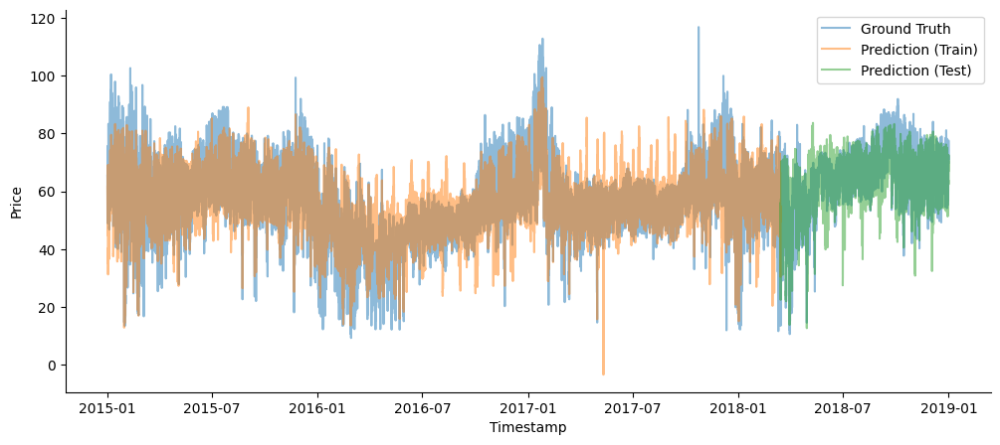

In [64]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(time_all, y_all, alpha=0.5, label = "Ground Truth")
ax.plot(time_train, preds_train, alpha=0.5, label = "Prediction (Train)")
ax.plot(time_test, preds_test, alpha=0.5, label = "Prediction (Test)")
ax.set_xlabel("Timestamp")
ax.set_ylabel("Price")
ax.legend()
remove_spines(ax)
plt.show()

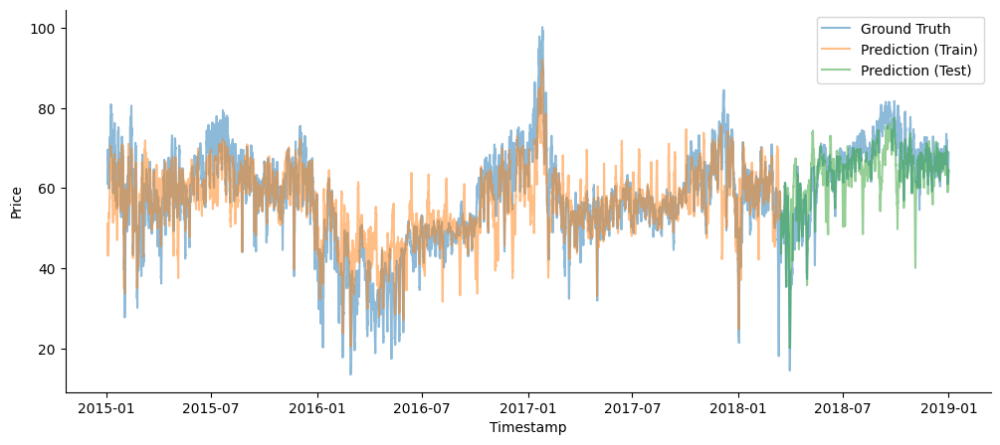

In [68]:
fig, ax = plt.subplots(figsize=(12,5))

y_all_smooth = pd.Series(y_all).rolling(window=32).mean()
preds_train_smooth = pd.Series(preds_train).rolling(window=32).mean()
preds_test_smooth = pd.Series(preds_test).rolling(window=32).mean()

ax.plot(time_all, y_all_smooth, alpha=0.5, label = "Ground Truth")
ax.plot(time_train, preds_train_smooth, alpha=0.5, label = "Prediction (Train)")
ax.plot(time_test, preds_test_smooth, alpha=0.5, label = "Prediction (Test)")
ax.set_xlabel("Timestamp")
ax.set_ylabel("Price")
ax.legend()
remove_spines(ax)
plt.show()

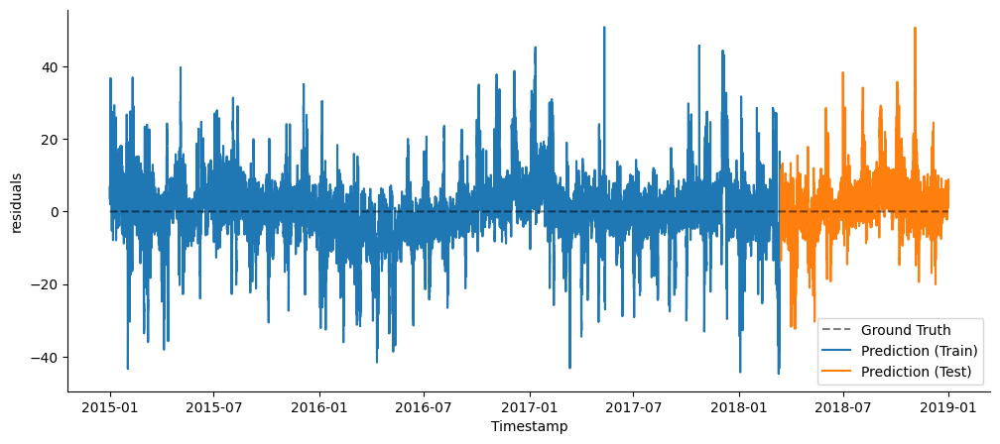

In [72]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(time_all, y_all-y_all, alpha=0.5, label = "Ground Truth", zorder=3, color='black', linestyle="--")
ax.plot(time_train, y_train-preds_train, alpha=1, label = "Prediction (Train)")
ax.plot(time_test, y_test-preds_test, alpha=1, label = "Prediction (Test)")
ax.set_xlabel("Timestamp")
ax.set_ylabel("residuals")
ax.legend()
remove_spines(ax)
plt.show()

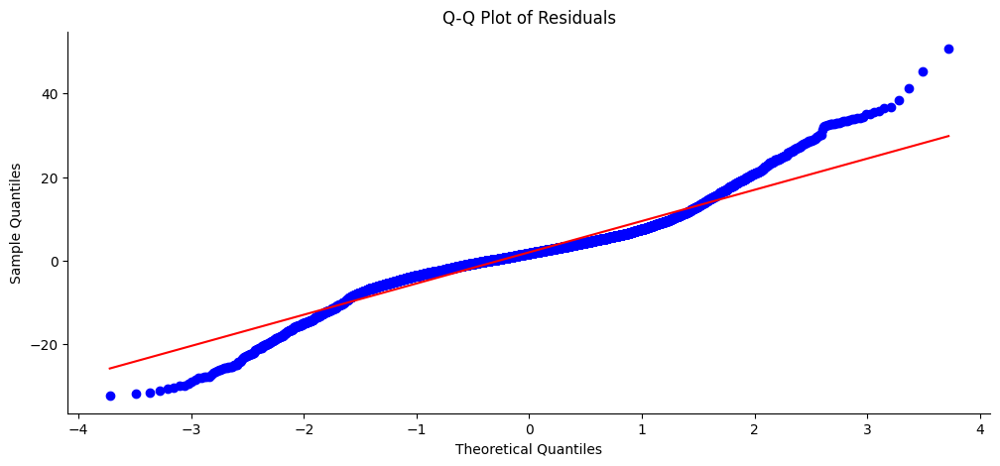

In [73]:
import scipy.stats as stats

residuals = y_test - preds_test

fig, ax = plt.subplots(figsize=(12,5))
stats.probplot(residuals, dist="norm", plot=ax)
ax.set_title("Q-Q Plot of Residuals")
ax.set_xlabel("Theoretical Quantiles")
ax.set_ylabel("Sample Quantiles")
remove_spines(ax)
plt.show()